## Pawpularity ConvNext Transfer Learning Approach in Pytorch

This notebook implements the new convnext architecture ([A ConvNet for the 2020s](https://arxiv.org/abs/2201.03545)) with pre-trained weights, replacing the output layer and re-training the last stage of convlutional layers to predict a pawpularity score bounded between 0 and 100.  Everything is implemented in pytorch.  Training is also reasonably fast with only ~7 epochs per fold necessary to get to maximum performance on the validation set.  

- A custom pytorch dataset class is implemented to attach scores to each image file, as well as the annotations.  Currently only the images are being used to train the model.  
- The model is a convnext architecture where the final fully connected layer is replaced with two fully connected layers and output 1 value.
- The model starts with pretrained weights for all of the convolutional layers, and the final set of layers in the model (stage 3) is unfrozen to allow it to learn a feature representation more specifi to this task. 
- The final activation is sigmoid to bound the output between 1 and 0, and output is multiplied by 100 in the training loop to give it a bounded output between 0 and 100 which matches the range of pawpularity scores.  
- The model is optimising for mean squared error(MSE), using Adam with weight decay to reduce overfitting.
- This uses 10 folds, and trains 10 models, keeping the weights from epoch that performed the best on the validation set for each.  The test dataset is predicted by running it through each of these 10 models and taking the average of the score predictions.
- The final competition evaluation metric is the square root of MSE or 
$ \textrm{RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2} $


### Load Dependencies

In [1]:
!pip install timm

In [2]:
!pip install requests Pillow

In [3]:
!pip install gdown

In [4]:
!gdown --id 1FD6OKhqwygBZC_Xhyj3SVx0q0PbQPTx4

/opt/conda/lib/python3.10/site-packages/gdown/cli.py:126: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (uriginal): https://drive.google.com/uc?id=1FD6OKhqwygBZC_Xhyj3SVx0q0PbQPTx4
From (redirected): https://drive.google.com/uc?id=1FD6OKhqwygBZC_Xhyj3SVx0q0PbQPTx4&confirm=t&uuid=03a02cdc-fe29-4f41-ac06-8368623dcb08
To: /kaggle/working/dataset NN'23.zip
100%|██████████████████████████████████████| 88.4M/88.4M [00:01<00:00, 59.1MB/s]


In [5]:
!unzip "/kaggle/working/dataset NN'23.zip" -d "/kaggle/working/"

Archive:  /kaggle/working/dataset NN'23.zip
   creating: /kaggle/working/dataset/
   creating: /kaggle/working/dataset/test/
  inflating: /kaggle/working/dataset/test/1073.jpeg  
  inflating: /kaggle/working/dataset/test/1090.jpeg  
  inflating: /kaggle/working/dataset/test/1132.jpeg  
  inflating: /kaggle/working/dataset/test/1133.jpeg  
  inflating: /kaggle/working/dataset/test/1153.jpeg  
  inflating: /kaggle/working/dataset/test/12.png  
  inflating: /kaggle/working/dataset/test/122.jpeg  
  inflating: /kaggle/working/dataset/test/1222.jpeg  
  inflating: /kaggle/working/dataset/test/1266.jpeg  
  inflating: /kaggle/working/dataset/test/1287.jpeg  
  inflating: /kaggle/working/dataset/test/1335.jpeg  
  inflating: /kaggle/working/dataset/test/134.jpeg  
  inflating: /kaggle/working/dataset/test/1348.jpeg  
  inflating: /kaggle/working/dataset/test/1411.jpeg  
  inflating: /kaggle/working/dataset/test/1413.jpeg  
  inflating: /kaggle/working/dataset/test/1415.jpeg  
  inflating: /ka

In [6]:
import pandas as pd
import numpy as np
import math
import time
import os
from skimage import io, transform
import PIL
import pandas as pd
import numpy as np
import math
import time
import os
from skimage import io, transform
import PIL

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt

import torch
from torchvision import datasets, transforms, models

from torch import nn, optim
import torch.nn.functional as F
from torch.optim.lr_scheduler import ExponentialLR
from torch.utils.data import Dataset
from torch.utils.data.sampler import SubsetRandomSampler
import torch.nn as nn
import torch.nn.functional as func
import torch.optim as optim
import torch.nn.functional as F
import sys
from timm.models.layers import trunc_normal_, DropPath
from timm.models.registry import register_model

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [7]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt

import torch
from torchvision import datasets, transforms, models

from torch import nn, optim
import torch.nn.functional as F
from torch.optim.lr_scheduler import ExponentialLR
from torch.utils.data import Dataset
from torch.utils.data.sampler import SubsetRandomSampler

### Set up the model structure

In [8]:
import torch.nn as nn
import torch.nn.functional as func
import torch.optim as optim

In [9]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split
from PIL import Image

class CustomDataset(Dataset):
    def __init__(self, directory, transform=None, is_test=False):
        self.directory = directory
        self.transform = transform
        self.is_test = is_test
        self.images, self.labels = self.load_images()

    def load_images(self):
        images = []
        labels = []
        if self.is_test:
            # For test data, labels are not available
            for img_file in os.listdir(self.directory):
                img_path = os.path.join(self.directory, img_file)
                images.append(img_path)
                labels.append(-1)  # Dummy label for test data
        else:
            # For train and validation data
            classes = sorted(os.listdir(self.directory))
            label_map = {class_name: index for index, class_name in enumerate(classes)}
            for label in classes:
                class_dir = os.path.join(self.directory, label)
                for img_file in os.listdir(class_dir):
                    img_path = os.path.join(class_dir, img_file)
                    images.append(img_path)
                    labels.append(label_map[label])

        return images, labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

In [10]:
class CustomDataset2(Dataset):
    def __init__(self, directory, transform=None, is_test=False):
        self.directory = directory
        self.transform = transform
        self.is_test = is_test
        self.images, self.labels = self.load_images()

    def load_images(self):
        images = []
        labels = []
        if self.is_test:
            # For test data, labels are not available
            for img_file in os.listdir(self.directory):
                img_path = os.path.join(self.directory, img_file)
                images.append(img_path)
                labels.append(-1)  # Dummy label for test data
        else:
            # For train and validation data
            classes = sorted(os.listdir(self.directory))
            label_map = {class_name: index for index, class_name in enumerate(classes)}
            for label in classes:
                class_dir = os.path.join(self.directory, label)
                for img_file in os.listdir(class_dir):
                    img_path = os.path.join(class_dir, img_file)
                    images.append(img_path)
                    labels.append(label_map[label])

        return images, labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label, img_path

In [11]:
# Placeholder for image transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize the image to 256x256
    transforms.RandomHorizontalFlip(0.1),
    transforms.RandomRotation(20),
    transforms.ToTensor(),
    transforms.RandomAdjustSharpness(sharpness_factor = 2, p = 0.1),
    transforms.ColorJitter(brightness = 0.1, contrast = 0.1, saturation = 0.1),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.247, 0.243, 0.261)),
    transforms.RandomErasing(p=0.75,scale=(0.02, 0.1),value = 1.0, inplace = False)
])

# Load dataset
train_dir = '/kaggle/working/dataset/train'
train_dataset = CustomDataset(train_dir, transform=transform)

# Splitting the dataset into training and validation
train_idx, val_idx = train_test_split(list(range(len(train_dataset))), test_size=0.1, random_state=42)
train_subset = torch.utils.data.Subset(train_dataset, train_idx)
val_subset = torch.utils.data.Subset(train_dataset, val_idx)

# Create DataLoaders
batch_size = 128  # You can adjust the batch size
train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

In [12]:
# Test dataset
test_dir = '/kaggle/working/dataset/test'
test_dataset = CustomDataset2(test_dir, transform=transform, is_test=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [13]:
import matplotlib.pyplot as plt

def visualize_images(dataloader, class_names=None, num_images=6):
    """
    Visualize images from a DataLoader.

    Parameters:
    - dataloader: DataLoader from which to visualize images.
    - class_names: List of class names for labels. If None, labels will be shown as integers.
    - num_images: Number of images to display.
    """
    # Set up the matplotlib figure
    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 3, 3))
    axes = axes.flatten()

    for i, (images, labels) in enumerate(dataloader):
        if i == num_images:
            break
        ax = axes[i]
        img = images[0] if images.dim() == 4 else images  # Adjust for batch dimension
        img = img.permute(1, 2, 0)  # Rearrange the dimensions for plt.imshow
        ax.imshow(img.cpu().numpy())
        label = labels[0].item() if labels.dim() > 0 else labels.item()
        title = class_names[label] if class_names else f'Label: {label}'
        ax.set_title(title)
        ax.axis('on')

    plt.tight_layout()
    plt.show()

In [14]:
def visualize_images(dataloader, class_names=None, num_images=25, rows=5, cols=5):
    """
    Visualize images from a DataLoader in a grid layout.

    Parameters:
    - dataloader: DataLoader from which to visualize images.
    - class_names: List of class names for labels. If None, labels will be shown as integers.
    - num_images: Total number of images to display.
    - rows: Number of rows in the grid.
    - cols: Number of columns in the grid.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten()

    image_count = 0
    for images, labels in dataloader:
        for i in range(images.shape[0]):
            if image_count >= num_images:
                break
            ax = axes[image_count]
            img = images[i].permute(1, 2, 0)  # Rearrange the dimensions for plt.imshow

            # Normalize the image for display
            img = img - img.min()
            img = img / img.max()

            ax.imshow(img.cpu().numpy())
            label = labels[i].item() if labels.dim() > 0 else labels.item()
            title = class_names[label] if class_names and label >= 0 else f'Label: {label}'
            ax.set_title(title)
            ax.axis('off')

            image_count += 1

        if image_count >= num_images:
            break

    # Hide any unused subplots
    for j in range(image_count, rows * cols):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

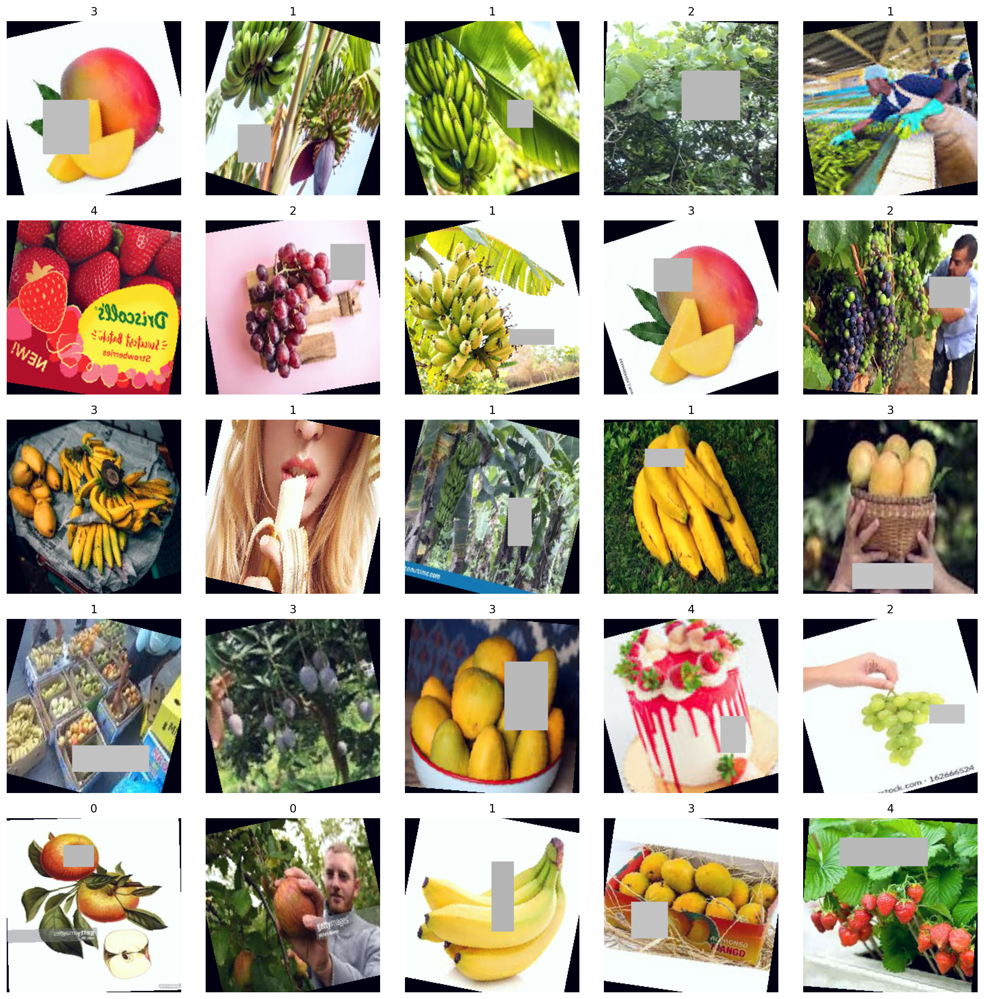

In [15]:
visualize_images(train_loader, class_names=['0', '1', '2', '3', '4'], num_images=25, rows=5, cols=5)

In [16]:
#visualize_images(test_loader, num_images=25, rows=5, cols=5)

**Downloading the pretrained model**

To access the pretrained model in a kaggle notebook, download it via pytorch on a local notebook, save the model using torch.save.  Then upload it to your kaggle notebook as a dataset which you can then load via torch.load without having to connect to the internet.

For the convnext model, I downloaded the [model definition](https://github.com/facebookresearch/ConvNeXt/blob/dc7823d8a2ecc554fcd57ff6cdb7748011bcdedd/models/convnext.py) (which includes url paths for pretrained weights) to a file, and uploaded this as a dataset to use in my kaggle notebook.  

I'm also using the a [timm dataset](https://www.kaggle.com/kozodoi/timm-pytorch-image-models) to load the timm module which is required for ConvNext.  

In [17]:
# Pytorch implementation of convnext

import torch
import torch.nn as nn
import torch.nn.functional as F
import sys
sys.path.append('../input/timm-pytorch-image-models/pytorch-image-models-master')
from timm.models.layers import trunc_normal_, DropPath
from timm.models.registry import register_model

class Block(nn.Module):
    r""" ConvNeXt Block. There are two equivalent implementations:
    (1) DwConv -> LayerNorm (channels_first) -> 1x1 Conv -> GELU -> 1x1 Conv; all in (N, C, H, W)
    (2) DwConv -> Permute to (N, H, W, C); LayerNorm (channels_last) -> Linear -> GELU -> Linear; Permute back
    We use (2) as we find it slightly faster in PyTorch
    
    Args:
        dim (int): Number of input channels.
        drop_path (float): Stochastic depth rate. Default: 0.0
        layer_scale_init_value (float): Init value for Layer Scale. Default: 1e-6.
    """
    def __init__(self, dim, drop_path=0., layer_scale_init_value=1e-6):
        super().__init__()
        self.dwconv = nn.Conv2d(dim, dim, kernel_size=7, padding=3, groups=dim) # depthwise conv
        self.norm = LayerNorm(dim, eps=1e-6)
        self.pwconv1 = nn.Linear(dim, 4 * dim) # pointwise/1x1 convs, implemented with linear layers
        self.act = nn.GELU()
        self.pwconv2 = nn.Linear(4 * dim, dim)
        self.gamma = nn.Parameter(layer_scale_init_value * torch.ones((dim)), 
                                    requires_grad=True) if layer_scale_init_value > 0 else None
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()

    def forward(self, x):
        input = x
        x = self.dwconv(x)
        x = x.permute(0, 2, 3, 1) # (N, C, H, W) -> (N, H, W, C)
        x = self.norm(x)
        x = self.pwconv1(x)
        x = self.act(x)
        x = self.pwconv2(x)
        if self.gamma is not None:
            x = self.gamma * x
        x = x.permute(0, 3, 1, 2) # (N, H, W, C) -> (N, C, H, W)

        x = input + self.drop_path(x)
        return x

class ConvNeXt(nn.Module):
    r""" ConvNeXt
        A PyTorch impl of : `A ConvNet for the 2020s`  -
          https://arxiv.org/pdf/2201.03545.pdf
    Args:
        in_chans (int): Number of input image channels. Default: 3
        num_classes (int): Number of classes for classification head. Default: 1000
        depths (tuple(int)): Number of blocks at each stage. Default: [3, 3, 9, 3]
        dims (int): Feature dimension at each stage. Default: [96, 192, 384, 768]
        drop_path_rate (float): Stochastic depth rate. Default: 0.
        layer_scale_init_value (float): Init value for Layer Scale. Default: 1e-6.
        head_init_scale (float): Init scaling value for classifier weights and biases. Default: 1.
    """
    def __init__(self, in_chans=3, num_classes=1000, 
                 depths=[3, 3, 9, 3], dims=[96, 192, 384, 768], drop_path_rate=0., 
                 layer_scale_init_value=1e-6, head_init_scale=1.,
                 ):
        super().__init__()

        self.downsample_layers = nn.ModuleList() # stem and 3 intermediate downsampling conv layers
        stem = nn.Sequential(
            nn.Conv2d(in_chans, dims[0], kernel_size=4, stride=4),
            LayerNorm(dims[0], eps=1e-6, data_format="channels_first")
        )
        self.downsample_layers.append(stem)
        for i in range(3):
            downsample_layer = nn.Sequential(
                    LayerNorm(dims[i], eps=1e-6, data_format="channels_first"),
                    nn.Conv2d(dims[i], dims[i+1], kernel_size=2, stride=2),
            )
            self.downsample_layers.append(downsample_layer)

        self.stages = nn.ModuleList() # 4 feature resolution stages, each consisting of multiple residual blocks
        dp_rates=[x.item() for x in torch.linspace(0, drop_path_rate, sum(depths))] 
        cur = 0
        for i in range(4):
            stage = nn.Sequential(
                *[Block(dim=dims[i], drop_path=dp_rates[cur + j], 
                layer_scale_init_value=layer_scale_init_value) for j in range(depths[i])]
            )
            self.stages.append(stage)
            cur += depths[i]

        self.norm = nn.LayerNorm(dims[-1], eps=1e-6) # final norm layer
        self.head = nn.Linear(dims[-1], num_classes)

        self.apply(self._init_weights)
        self.head.weight.data.mul_(head_init_scale)
        self.head.bias.data.mul_(head_init_scale)

    def _init_weights(self, m):
        if isinstance(m, (nn.Conv2d, nn.Linear)):
            trunc_normal_(m.weight, std=.02)
            nn.init.constant_(m.bias, 0)

    def forward_features(self, x):
        for i in range(4):
            x = self.downsample_layers[i](x)
            x = self.stages[i](x)
        return self.norm(x.mean([-2, -1])) # global average pooling, (N, C, H, W) -> (N, C)

    def forward(self, x):
        x = self.forward_features(x)
        x = self.head(x)
        return x

class LayerNorm(nn.Module):
    r""" LayerNorm that supports two data formats: channels_last (default) or channels_first. 
    The ordering of the dimensions in the inputs. channels_last corresponds to inputs with 
    shape (batch_size, height, width, channels) while channels_first corresponds to inputs 
    with shape (batch_size, channels, height, width).
    """
    def __init__(self, normalized_shape, eps=1e-6, data_format="channels_last"):
        super().__init__()
        self.weight = nn.Parameter(torch.ones(normalized_shape))
        self.bias = nn.Parameter(torch.zeros(normalized_shape))
        self.eps = eps
        self.data_format = data_format
        if self.data_format not in ["channels_last", "channels_first"]:
            raise NotImplementedError 
        self.normalized_shape = (normalized_shape, )
    
    def forward(self, x):
        if self.data_format == "channels_last":
            return F.layer_norm(x, self.normalized_shape, self.weight, self.bias, self.eps)
        elif self.data_format == "channels_first":
            u = x.mean(1, keepdim=True)
            s = (x - u).pow(2).mean(1, keepdim=True)
            x = (x - u) / torch.sqrt(s + self.eps)
            x = self.weight[:, None, None] * x + self.bias[:, None, None]
            return x


model_urls = {
    "convnext_tiny_1k": "https://dl.fbaipublicfiles.com/convnext/convnext_tiny_1k_224_ema.pth",
    "convnext_small_1k": "https://dl.fbaipublicfiles.com/convnext/convnext_small_1k_224_ema.pth",
    "convnext_base_1k": "https://dl.fbaipublicfiles.com/convnext/convnext_base_1k_224_ema.pth",
    "convnext_large_1k": "https://dl.fbaipublicfiles.com/convnext/convnext_large_1k_224_ema.pth",
    "convnext_base_22k": "https://dl.fbaipublicfiles.com/convnext/convnext_base_22k_224.pth",
    "convnext_large_22k": "https://dl.fbaipublicfiles.com/convnext/convnext_large_22k_224.pth",
}

@register_model
def convnext_tiny(pretrained=False, **kwargs):
    model = ConvNeXt(depths=[3, 3, 9, 3], dims=[96, 192, 384, 768], **kwargs)
    if pretrained:
        url = model_urls['convnext_tiny_1k']
        checkpoint = torch.hub.load_state_dict_from_url(url=url, map_location="cpu", check_hash=True)
        model.load_state_dict(checkpoint["model"])
    return model

@register_model
def convnext_small(pretrained=False, **kwargs):
    model = ConvNeXt(depths=[3, 3, 27, 3], dims=[96, 192, 384, 768], **kwargs)
    if pretrained:
        url = model_urls['convnext_small_1k']
        checkpoint = torch.hub.load_state_dict_from_url(url=url, map_location="cpu", check_hash=True)
        model.load_state_dict(checkpoint["model"])
    return model

@register_model
def convnext_base(pretrained=False, in_22k=False, **kwargs):
    model = ConvNeXt(depths=[3, 3, 27, 3], dims=[128, 256, 512, 1024], **kwargs)
    if pretrained:
        url = model_urls['convnext_base_22k'] if in_22k else model_urls['convnext_base_1k']
        checkpoint = torch.hub.load_state_dict_from_url(url=url, map_location="cpu", check_hash=True)
        model.load_state_dict(checkpoint["model"])
    return model

@register_model
def convnext_large(pretrained=False, in_22k=False, **kwargs):
    model = ConvNeXt(depths=[3, 3, 27, 3], dims=[192, 384, 768, 1536], **kwargs)
    if pretrained:
        url = model_urls['convnext_large_22k'] if in_22k else model_urls['convnext_large_1k']
        checkpoint = torch.hub.load_state_dict_from_url(url=url, map_location="cpu", check_hash=True)
        model.load_state_dict(checkpoint["model"])
    return model

/tmp/ipykernel_26/3255109070.py:151: UserWarning: Overwriting convnext_tiny in registry with __main__.convnext_tiny. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  def convnext_tiny(pretrained=False, **kwargs):
/tmp/ipykernel_26/3255109070.py:160: UserWarning: Overwriting convnext_small in registry with __main__.convnext_small. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  def convnext_small(pretrained=False, **kwargs):
/tmp/ipykernel_26/3255109070.py:169: UserWarning: Overwriting convnext_base in registry with __main__.convnext_base. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  def convnext_base(pretrained=False, in_22k=False, **kwargs):
/tmp/ipykernel_26/3255109070.py:178: UserWarning: Overwriting convnext_large in registry with __main__.convnext_large. This is because the name be

**Load the model, replace the output layer, and choose which layers to freeze/train**

I'm replacing the final fully connected layer of the convnext model with my own feed forward network, and also unfreezing the last stage of convnext to allow weights there to be trained.  Currently I'm not using the annotations in the model at all. 

In [18]:
model = convnext_large(True)

Downloading: "https://dl.fbaipublicfiles.com/convnext/convnext_large_1k_224_ema.pth" to /root/.cache/torch/hub/checkpoints/convnext_large_1k_224_ema.pth
100%|██████████| 755M/755M [00:02<00:00, 306MB/s]


In [19]:
model1 = convnext_base(True)

Downloading: "https://dl.fbaipublicfiles.com/convnext/convnext_base_1k_224_ema.pth" to /root/.cache/torch/hub/checkpoints/convnext_base_1k_224_ema.pth
100%|██████████| 338M/338M [00:01<00:00, 285MB/s]


In [20]:
# Load the pretrained resnet50 from a file
def load_model():

    # Disable gradients on all model parameters to freeze the weights
    for param in model.parameters():
        param.requires_grad = False
    # Replace the final fully connected resnet layer with a 2 fc layer network and sigmoid output
    # Also use the annotations
    model.head = nn.Sequential(nn.Linear(1536, 256),
                             nn.ReLU(),
                             nn.Linear(256, 5),
                             nn.Sigmoid())


    for param in model.head.parameters():
        param.requires_grad = True

    # Unfreeze the last stage
    i = 0
    for name, param in model.named_parameters():
        if i > 312:
            print(name)
            param.requires_grad = True
        i+= 1
    
    return model

model = load_model()

stages.3.0.gamma
stages.3.0.dwconv.weight
stages.3.0.dwconv.bias
stages.3.0.norm.weight
stages.3.0.norm.bias
stages.3.0.pwconv1.weight
stages.3.0.pwconv1.bias
stages.3.0.pwconv2.weight
stages.3.0.pwconv2.bias
stages.3.1.gamma
stages.3.1.dwconv.weight
stages.3.1.dwconv.bias
stages.3.1.norm.weight
stages.3.1.norm.bias
stages.3.1.pwconv1.weight
stages.3.1.pwconv1.bias
stages.3.1.pwconv2.weight
stages.3.1.pwconv2.bias
stages.3.2.gamma
stages.3.2.dwconv.weight
stages.3.2.dwconv.bias
stages.3.2.norm.weight
stages.3.2.norm.bias
stages.3.2.pwconv1.weight
stages.3.2.pwconv1.bias
stages.3.2.pwconv2.weight
stages.3.2.pwconv2.bias
norm.weight
norm.bias
head.0.weight
head.0.bias
head.2.weight
head.2.bias


In [21]:
# Load the pretrained resnet50 from a file
def load_model():

    # Disable gradients on all model parameters to freeze the weights
    for param in model1.parameters():
        param.requires_grad = False
    # Replace the final fully connected resnet layer with a 2 fc layer network and sigmoid output
    # Also use the annotations
    model1.head = nn.Sequential(nn.Linear(1024, 256),
                             nn.ReLU(),
                             nn.Linear(256, 5),
                             nn.Sigmoid())


    for param in model1.head.parameters():
        param.requires_grad = True

    # Unfreeze the last stage
    i = 0
    for name, param in model1.named_parameters():
        if i > 312:
            print(name)
            param.requires_grad = True
        i+= 1
    
    return model1

model1 = load_model()

stages.3.0.gamma
stages.3.0.dwconv.weight
stages.3.0.dwconv.bias
stages.3.0.norm.weight
stages.3.0.norm.bias
stages.3.0.pwconv1.weight
stages.3.0.pwconv1.bias
stages.3.0.pwconv2.weight
stages.3.0.pwconv2.bias
stages.3.1.gamma
stages.3.1.dwconv.weight
stages.3.1.dwconv.bias
stages.3.1.norm.weight
stages.3.1.norm.bias
stages.3.1.pwconv1.weight
stages.3.1.pwconv1.bias
stages.3.1.pwconv2.weight
stages.3.1.pwconv2.bias
stages.3.2.gamma
stages.3.2.dwconv.weight
stages.3.2.dwconv.bias
stages.3.2.norm.weight
stages.3.2.norm.bias
stages.3.2.pwconv1.weight
stages.3.2.pwconv1.bias
stages.3.2.pwconv2.weight
stages.3.2.pwconv2.bias
norm.weight
norm.bias
head.0.weight
head.0.bias
head.2.weight
head.2.bias


In [22]:
print(model1)

ConvNeXt(
  (downsample_layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm()
    )
    (1): Sequential(
      (0): LayerNorm()
      (1): Conv2d(128, 256, kernel_size=(2, 2), stride=(2, 2))
    )
    (2): Sequential(
      (0): LayerNorm()
      (1): Conv2d(256, 512, kernel_size=(2, 2), stride=(2, 2))
    )
    (3): Sequential(
      (0): LayerNorm()
      (1): Conv2d(512, 1024, kernel_size=(2, 2), stride=(2, 2))
    )
  )
  (stages): ModuleList(
    (0): Sequential(
      (0): Block(
        (dwconv): Conv2d(128, 128, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=128)
        (norm): LayerNorm()
        (pwconv1): Linear(in_features=128, out_features=512, bias=True)
        (act): GELU(approximate='none')
        (pwconv2): Linear(in_features=512, out_features=128, bias=True)
        (drop_path): Identity()
      )
      (1): Block(
        (dwconv): Conv2d(128, 128, kernel_size=(7, 7), stride=(1, 1),

In [23]:
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch
from IPython.display import clear_output

%matplotlib inline

def train(model, dataloader, loss_fn, optimizer, device, ldl, lts): ## ldl = length dataloader, lts = length dataset
    model.train()  ## puts the model on training mode such as enabling gradient computations
    total_loss = 0 ## over current epoch
    
    total_correct = 0 ## extra, calculate the accuracy on training set during epoch
    for batch in tqdm(dataloader):
        inputs, labels = batch[0].to(device), batch[1].to(device)
        optimizer.zero_grad() ## deletes stored gradients 
        outputs = model(inputs)

        loss = loss_fn(outputs, labels)

        loss.backward()     ## computes gradients
        optimizer.step()    ## updates parameters   
        
        total_loss += loss.item()
        
        predictions = outputs.argmax(dim=1)

        correct = (predictions == labels).sum().item()
        total_correct += correct
        
    return total_loss / ldl, total_correct / lts

def compute_accuracy(dataloader, model):
    model.eval()  # switch to evaluation mode

    total_correct = 0
    total_count = 0
    with torch.no_grad():
        for batch in dataloader:
            inputs, labels = batch[0].to(device), batch[1].to(device)
            outputs = model(inputs)
            predictions = outputs.argmax(dim=1)
            correct = (predictions == labels).sum().item()
            total_correct += correct
            total_count += len(labels)

    accuracy = total_correct / total_count

    return accuracy

In [24]:
import torch.optim as optim

ldl = len(train_loader) ## fixed

bestScore = 0
patience = 50          # if model accuracy on validation dataset didn't improve for 10 epochs it will stop and save highest scoring model
num_epochs = 25
best_epoch = 0
loss_fn = nn.CrossEntropyLoss()

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Learning rate scheduler
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
# Alternatively, scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=10)

# Device configuration for Model #2
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda:0


Epoch 25/25, Train Loss: 0.9102, lr: 0.0000039
Cross Acc: 0.9505, Train Acc: 0.9893


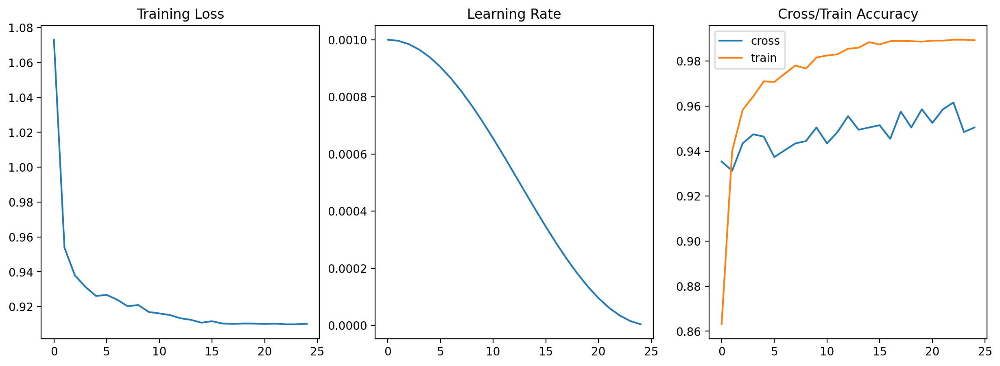

In [25]:
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython.display import clear_output

%matplotlib inline
# DataParallel for multi-GPU usage
if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs")
    model = nn.DataParallel(model)

model.to(device)  ## the following lists will be used to plot the loss and accuracy curves by keeping track of the values over epochs
train_losses = []
cross_accs = []
train_accs = []
lr = []
for epoch in range(num_epochs):
    train_loss, train_acc = train(model, train_loader, loss_fn, optimizer, device, ldl, ldl*batch_size)
    CurrentScore = compute_accuracy(val_loader, model)

    lr.append(optimizer.param_groups[0]['lr'])
    train_losses.append(train_loss)
    cross_accs.append(CurrentScore)
    train_accs.append(train_acc)
    clear_output(wait=True) # wait for all plots to be shown, then erase them and display the updated ones

    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, lr: {lr[-1]:.7f}')
    print(f'Cross Acc: {CurrentScore:.4f}, Train Acc: {train_acc:.4f}')
    scheduler.step()

    # initialize 3 subplots to plot the loss curve, learning rate curve and accuracy curve
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].plot(train_losses)
    axs[0].set_title('Training Loss')
    axs[1].plot(lr)
    axs[1].set_title('Learning Rate')
    axs[2].plot(cross_accs, label="cross")
    axs[2].plot(train_accs, label = "train")
    axs[2].set_title('Cross/Train Accuracy')
    axs[2].legend()
    plt.show(block=False)
    if CurrentScore > bestScore:
        bestScore = CurrentScore
        best_epoch = epoch
        torch.save(model.state_dict(), 'best_model.pt')
    elif epoch - best_epoch >= patience:
        print(f'Validation loss did not improve for {patience} epochs. Training stopped.')
        torch.save(model.state_dict(), f'model_epoch_{epoch}.pt')
        break

In [26]:
import torch.optim as optim

ldl = len(train_loader) ## fixed

bestScore = 0
patience = 50          # if model accuracy on validation dataset didn't improve for 10 epochs it will stop and save highest scoring model
num_epochs = 25
best_epoch = 0
loss_fn = nn.CrossEntropyLoss()

# Optimizer
optimizer = optim.Adam(model1.parameters(), lr=0.001)

# Learning rate scheduler
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
# Alternatively, scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=10)

# Device configuration for Model #2
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda:0


Epoch 25/25, Train Loss: 0.9101, lr: 0.0000039
Cross Acc: 0.9515, Train Acc: 0.9888


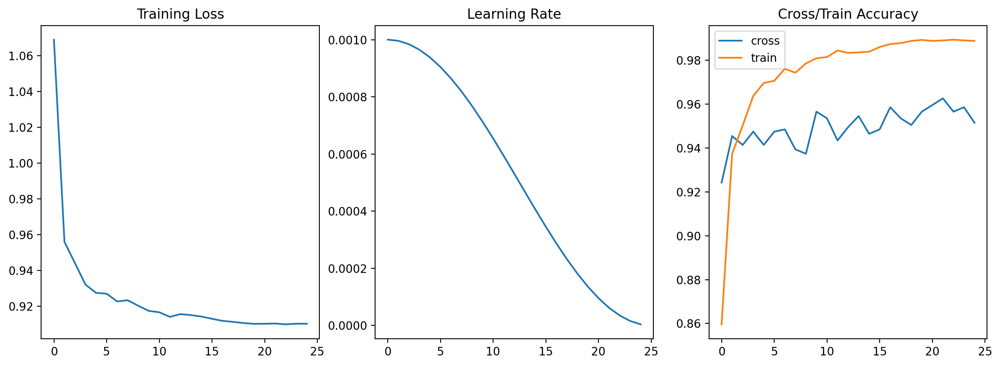

In [27]:
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython.display import clear_output

%matplotlib inline
# DataParallel for multi-GPU usage
if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs")
    model1 = nn.DataParallel(model1)

model1.to(device)  ## the following lists will be used to plot the loss and accuracy curves by keeping track of the values over epochs
train_losses = []
cross_accs = []
train_accs = []
lr = []
for epoch in range(num_epochs):
    train_loss, train_acc = train(model1, train_loader, loss_fn, optimizer, device, ldl, ldl*batch_size)
    CurrentScore = compute_accuracy(val_loader, model1)

    lr.append(optimizer.param_groups[0]['lr'])
    train_losses.append(train_loss)
    cross_accs.append(CurrentScore)
    train_accs.append(train_acc)
    clear_output(wait=True) # wait for all plots to be shown, then erase them and display the updated ones

    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, lr: {lr[-1]:.7f}')
    print(f'Cross Acc: {CurrentScore:.4f}, Train Acc: {train_acc:.4f}')
    scheduler.step()

    # initialize 3 subplots to plot the loss curve, learning rate curve and accuracy curve
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].plot(train_losses)
    axs[0].set_title('Training Loss')
    axs[1].plot(lr)
    axs[1].set_title('Learning Rate')
    axs[2].plot(cross_accs, label="cross")
    axs[2].plot(train_accs, label = "train")
    axs[2].set_title('Cross/Train Accuracy')
    axs[2].legend()
    plt.show(block=False)
    if CurrentScore > bestScore:
        bestScore = CurrentScore
        best_epoch = epoch
        torch.save(model1.state_dict(), 'best_model_1.pt')
    elif epoch - best_epoch >= patience:
        print(f'Validation loss did not improve for {patience} epochs. Training stopped.')
        torch.save(model1.state_dict(), f'model_1_epoch_{epoch}.pt')
        break

In [28]:
model.load_state_dict(torch.load('/kaggle/working/best_model.pt', map_location=device))

<All keys matched successfully>

In [29]:
model1.load_state_dict(torch.load('/kaggle/working/best_model_1.pt', map_location=device))

<All keys matched successfully>

In [30]:
def ensemble_accuracy(dataloader, models):
    model0 = models[0]
    model1 = models[1]
    model0.eval()
    model1.eval()
    
    total_correct = 0
    total_count = 0
    with torch.no_grad():
        for batch in dataloader:
            inputs, labels = batch[0].to(device), batch[1].to(device)
            outputs1 = model0(inputs)
            outputs2 = model1(inputs)
            outputs = (outputs1 + outputs2)/2
            predictions = outputs.argmax(dim=1)
            correct = (predictions == labels).sum().item()
            total_correct += correct
            total_count += len(labels)

    accuracy = total_correct / total_count

    return accuracy

In [31]:
models = [model,model1]
ensemble_accuracy(val_loader, models)

0.9585858585858585

In [32]:
def getPreds(dataloader, models):
    model0 = models[0]
    model1 = models[1]
    
    preds = []
    labels = []
    with torch.no_grad():
        for batch in dataloader:
            inputs = batch[0].to(device)
            outputs1 = model0(inputs)
            outputs2 = model1(inputs)
            outputs = (outputs1 + outputs2) / 2
            predictions = outputs.argmax(dim=1)
            preds.extend(predictions.cpu().numpy())
            labels.append(batch[2])
    return preds, labels

In [33]:
preds,names = getPreds(test_loader, models)
names = names[0]
names = [x.split("/")[-1].split(".")[0] for x in names]

In [34]:
preds = [p+1 for p in preds]

In [35]:
# import time

# infloader = torch.utils.data.DataLoader(val_loader, batch_size=1, shuffle=False, num_workers=2)
# img, _ = next(iter(infloader))
# img = img.to(device)
# start = time.time()
# _ = model(img)
# end = time.time()
 
# print(end - start)

In [36]:
import pandas as pd

submn = pd.DataFrame({'image_id' : names,'label': preds})
submn.to_csv('Team111.csv', index=False)
submn

,image_id,label
0,900,4
1,792,5
2,567,3
3,54,3
4,1575,3
...,...,...
95,1153,1
96,535,4
97,1721,5
98,1751,3
